In [2]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
#Data exploration


words = open('names.txt', 'r').read().splitlines()
#looking at last 10 names to get a sense of what sort of data we are working with
words[:10]

['emma',
 'olivia',
 'ava',
 'isabella',
 'sophia',
 'charlotte',
 'mia',
 'amelia',
 'harper',
 'evelyn']

In [4]:
# let's see how large of a dataset we are working with
len(words)

32033

In [7]:
# let's explore the data further and see what lengths of words we are dealing with

min_max_lengths = [min(len(w) for w in words), max(len(w) for w in words)]
min_max_lengths

[2, 15]

In [10]:
# In order to create bigram pairings we can do the following: 

# Take each word (name) found within the dataset and split them into bigrams with the following code
# for example, Take one word, words[:1]
# then for the chosen word "emma", w ->  'e', 'm', 'm', 'a'. w[1:] -> 'm', 'm', 'a'
        # finally, zip() function will pair them as   ('e','m'),('m','m'),('m','a') and there we have our bigrams

for w in words[:1]: 
    for ch1, ch2 in zip(w, w[1:]):  
        print(ch1, ch2)

e m
m m
m a


In [12]:
# Additionally, for our model to work, it needs to have some sort of symbol for marking "start" and "end"
# those are generally used in order to mark start/stop of generation of the new word, when generated by the model attempting to create a sample based on the dataset.

for w in words[:1]:
    chs = ['<S>'] + list(w) + ['<E>'] 
    for ch1, ch2 in zip(chs, chs[1:]):  
        print(ch1, ch2)
        
        

<S> e
e m
m m
m a
a <E>


In [17]:
# We can start calculating probabilities for each letter "x2", occuring after letter 'x2'
# for that, let's first calculate how often each of the bigrams occur in the dataset. 

b = {}  # stores bigram frequencies 

for w in words:
    chs = ['<S>'] + list(w) + ['<E>'] 
    for ch1, ch2 in zip(chs, chs[1:]):  
        bigram = (ch1, ch2)
        b[bigram] = b.get(bigram, 0) + 1

# let's sort b dictionary from most frequent to least frequent bigrams in order to assess if the data distribution makes sense
sorted(b.items(), key = lambda kv: -kv[1])

[(('n', '<E>'), 6763),
 (('a', '<E>'), 6640),
 (('a', 'n'), 5438),
 (('<S>', 'a'), 4410),
 (('e', '<E>'), 3983),
 (('a', 'r'), 3264),
 (('e', 'l'), 3248),
 (('r', 'i'), 3033),
 (('n', 'a'), 2977),
 (('<S>', 'k'), 2963),
 (('l', 'e'), 2921),
 (('e', 'n'), 2675),
 (('l', 'a'), 2623),
 (('m', 'a'), 2590),
 (('<S>', 'm'), 2538),
 (('a', 'l'), 2528),
 (('i', '<E>'), 2489),
 (('l', 'i'), 2480),
 (('i', 'a'), 2445),
 (('<S>', 'j'), 2422),
 (('o', 'n'), 2411),
 (('h', '<E>'), 2409),
 (('r', 'a'), 2356),
 (('a', 'h'), 2332),
 (('h', 'a'), 2244),
 (('y', 'a'), 2143),
 (('i', 'n'), 2126),
 (('<S>', 's'), 2055),
 (('a', 'y'), 2050),
 (('y', '<E>'), 2007),
 (('e', 'r'), 1958),
 (('n', 'n'), 1906),
 (('y', 'n'), 1826),
 (('k', 'a'), 1731),
 (('n', 'i'), 1725),
 (('r', 'e'), 1697),
 (('<S>', 'd'), 1690),
 (('i', 'e'), 1653),
 (('a', 'i'), 1650),
 (('<S>', 'r'), 1639),
 (('a', 'm'), 1634),
 (('l', 'y'), 1588),
 (('<S>', 'l'), 1572),
 (('<S>', 'c'), 1542),
 (('<S>', 'e'), 1531),
 (('j', 'a'), 1473),
 (

In [18]:
# now we use pytorch library which allows us to use tensors and built in functionalities to easily construct a bigram model

# we can create a 28x28 tensor, has enough space for all 26 letters of the english alphabet + Start/End symbols. 

N = torch.zeros((28,28), dtype=torch.int32)
N

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [29]:
# since, we can only index with integers in tensors, let's create special mappings
# stoi -> string to integer
# itos -> integer to string

chars = sorted(list(set(''.join(words))))

stoi = {s:i for i,s in enumerate(chars)}
stoi['<S>'] = 26        # Since these characters are not found within the dataset itself
stoi['<E>'] = 27

itos = {i:s for s,i in stoi.items()}


In [30]:
for w in words:
    chs = ['<S>'] + list(w) + ['<E>'] 
    for ch1, ch2 in zip(chs, chs[1:]):  
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        N[ix1,ix2] += 1          # now we can directly increment each bigrams occurence, in order to judge it's frequency
        
# This is much more convienient for indexation than using a dictionary
# to access number of occurances of 'm' after 'a'
# we can simply do N[stoi['a'], stoi['m']]

(-0.5, 27.5, 27.5, -0.5)

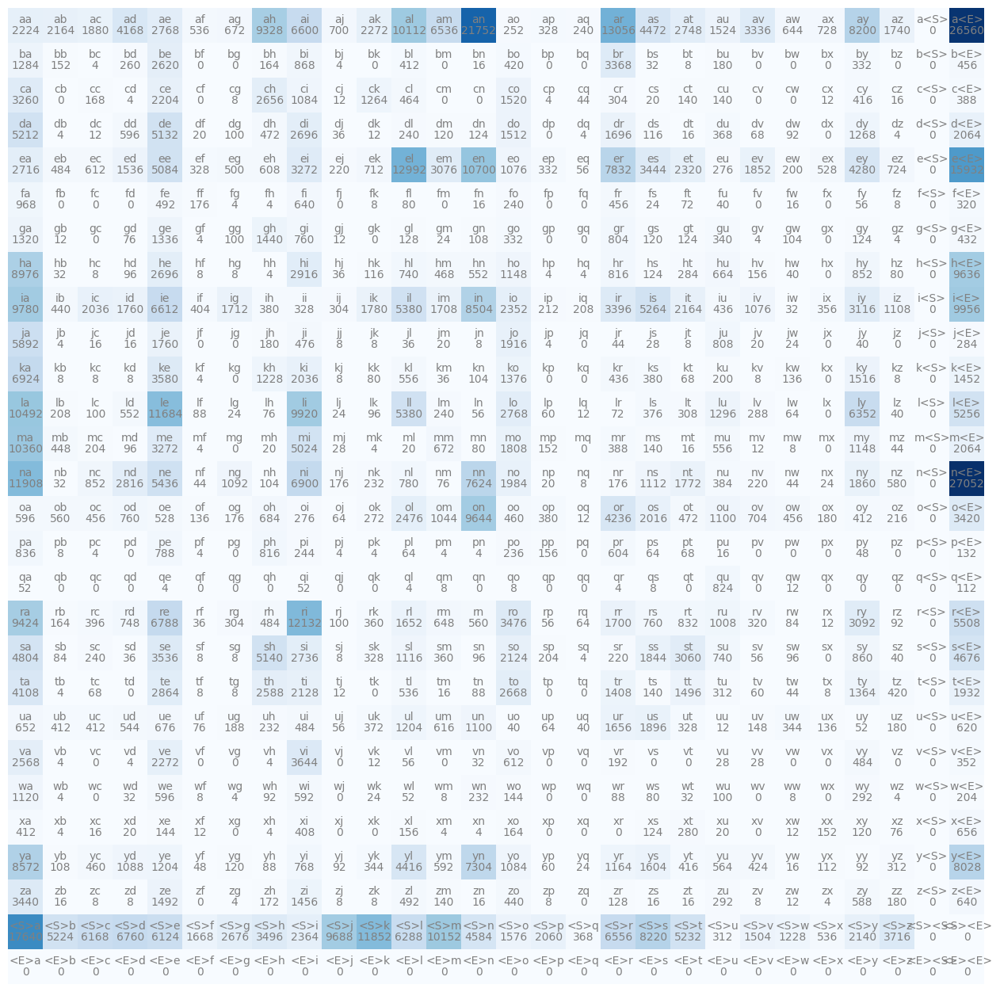

In [31]:
# let's visualize the tensor that we have gained

plt.figure(figsize=(16, 16))
plt.imshow(N, cmap='Blues')
for i in range(28):
    for j in range(28):
        chstr = itos[i] + itos[j]
        plt.text(j,i, chstr, ha='center', va='bottom', color='gray')
        plt.text(j,i, N[i, j].item(), ha="center", va="top", color="gray")
plt.axis('off')

##### Looking at the plot of the bigram frequency tensor above, we may be able to see an obvious inefficiency

(-0.5, 26.5, 26.5, -0.5)

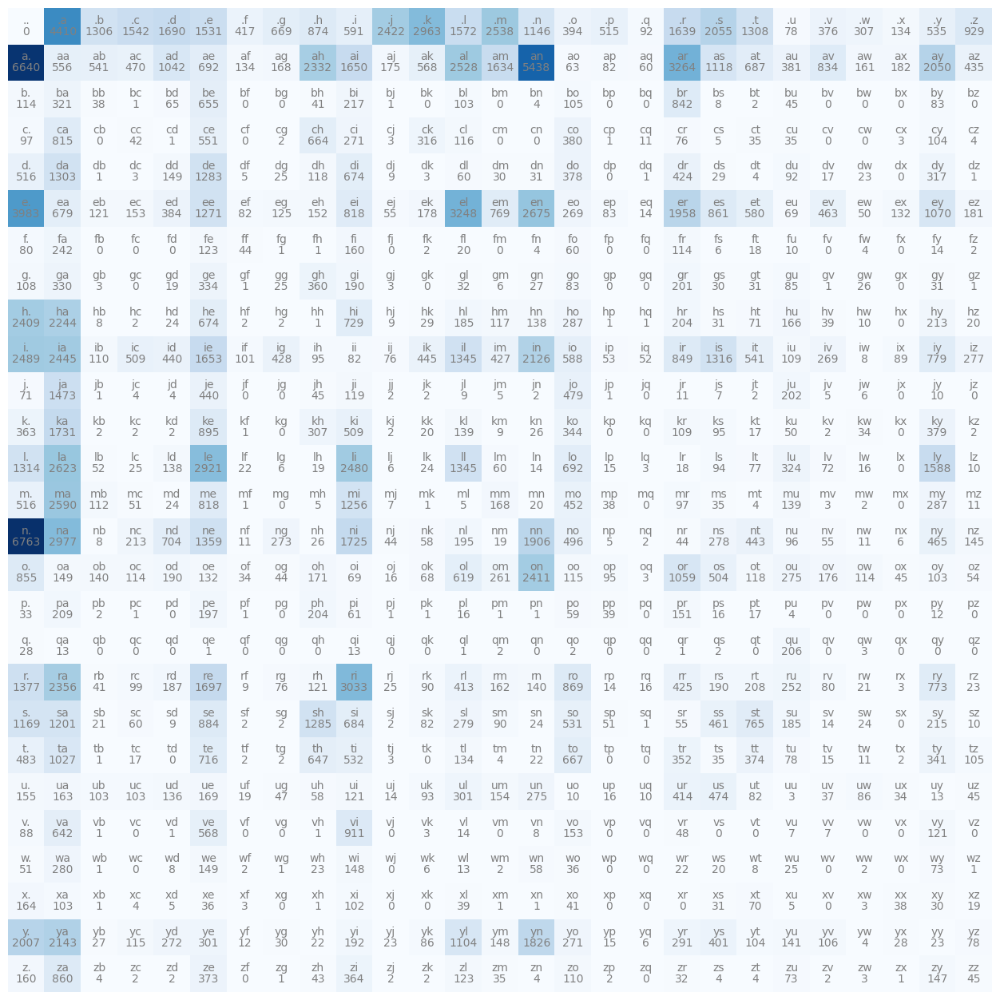

In [37]:
# The issue is that <S> will never be the end of the word and <E> will never be the start of the word
# thus, wasted rows/columns. We can easily get rid of this inefficiency by introducing '.' instead

N = torch.zeros((27,27), dtype=torch.int32)

chars = sorted(list(set(''.join(words))))
stoi = {s:i+1 for i,s in enumerate(chars)}
stoi['.'] = 0         # instead of <S> and <E> we have only one '.'

itos = {i:s for s,i in stoi.items()}
stoi
for w in words:
    chs = ['.'] + list(w) + ['.'] 
    for ch1, ch2 in zip(chs, chs[1:]):  
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        N[ix1,ix2] += 1  
        

plt.figure(figsize=(16, 16))
plt.imshow(N, cmap='Blues')
for i in range(27):
    for j in range(27):
        chstr = itos[i] + itos[j]
        plt.text(j,i, chstr, ha='center', va='bottom', color='gray')
        plt.text(j,i, N[i, j].item(), ha="center", va="top", color="gray")
plt.axis('off')        

In [38]:
# The tensor above has all the information necessary to start sampling

# The following is how you can access the very first row for example
N[0, :]

tensor([   0, 4410, 1306, 1542, 1690, 1531,  417,  669,  874,  591, 2422, 2963,
        1572, 2538, 1146,  394,  515,   92, 1639, 2055, 1308,   78,  376,  307,
         134,  535,  929], dtype=torch.int32)

In [39]:
# in order to get probabilities from the frequencies
# we need to convert to floats and divide by the total sum

p = [N0].float()
p = p / p.sum()
p

tensor([0.0000, 0.1377, 0.0408, 0.0481, 0.0528, 0.0478, 0.0130, 0.0209, 0.0273,
        0.0184, 0.0756, 0.0925, 0.0491, 0.0792, 0.0358, 0.0123, 0.0161, 0.0029,
        0.0512, 0.0642, 0.0408, 0.0024, 0.0117, 0.0096, 0.0042, 0.0167, 0.0290])

In [40]:
# pytorch has an useful generator object that can be used to 'randomly' generate numbers, in a deterministic manner
# This is useful for debugging as you can be assured that the "random" object remains the same and also for me to check if your model is behaving properly 

g = torch.Generator().manual_seed(2147483647)
p = torch.rand(3, generator=g)
p = p/p.sum()
p          # obtaining the probabilities

tensor([0.6064, 0.3033, 0.0903])

In [41]:
torch.multinomial(p, num_samples=100, replacement=True, generator=g) # replacement=True means that even if we draw an element, on the next generation it is still available for generation

# according to the generator, you'd expect 60% to be 0, 30% to be 1 and only 10% to be 2. looking at results, it seems to be true

tensor([1, 1, 2, 0, 0, 2, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 2, 0, 0,
        1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1,
        0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
        0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 1, 0,
        0, 1, 1, 1])

In [48]:
# using first row of the tensor, we can now sample our first letter

p = N[0].float()
p = p / p.sum()
p

g = torch.Generator().manual_seed(2147483647)
ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
itos[ix]

'j'

In [55]:
# now to generate the entire word (name), we will simply keep sampling using the row of the last generated letter, until we generate a '.'
g = torch.Generator().manual_seed(2147483647)

out = []
ix = 0
while True:
    p = N[ix].float()
    p = p/p.sum()
    ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
    out.append(itos[ix])
    if ix == 0:
        break
print(''.join(out))  

junide.


In [58]:

# we can go ahead and generate several names while at it
g = torch.Generator().manual_seed(2147483647)

for i in range(20):
    out = []
    ix = 0
    while True:
        p = N[ix].float()
        p = p/p.sum()
        ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[ix])
        if ix == 0:
            break
    print(''.join(out))  

junide.
janasah.
p.
cony.
a.
nn.
kohin.
tolian.
juee.
ksahnaauranilevias.
dedainrwieta.
ssonielylarte.
faveumerifontume.
phynslenaruani.
core.
yaenon.
ka.
jabdinerimikimaynin.
anaasn.
ssorionsush.


In [64]:
# let's try to make this process more efficient
# one way would be pre-computing the probabilities, in "P" tensor, instead of recalculating them each time

P = N.float()
P = P / P.sum(1, keepdim=True)

g = torch.Generator().manual_seed(2147483647)

for i in range(20):
    out = []
    ix = 0
    while True:
        p = P[ix]
        
        ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[ix])
        if ix == 0:
            break
    print(''.join(out)) 

junide.
janasah.
p.
cony.
a.
nn.
kohin.
tolian.
juee.
ksahnaauranilevias.
dedainrwieta.
ssonielylarte.
faveumerifontume.
phynslenaruani.
core.
yaenon.
ka.
jabdinerimikimaynin.
anaasn.
ssorionsush.


In [65]:
# okay, now looking at words generated it's hard to say if the model is performing well or not as it is simply making up new names

# That is why we use a loss function, more precisely log probability

for w in words:
    chs = ['.'] + list(w) + ['.'] 
    for ch1, ch2 in zip(chs, chs[1:]):  
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        prob = P[ix1,ix2]
        print(f'{ch1}{ch2}: {prob:4f}')
        
# we can see the probabilities of each bigram learnt.
# since 1/27 = 4%, anything above 4% that we have learnt can be considered useful

.e: 0.047794
em: 0.037654
mm: 0.025294
ma: 0.389943
a.: 0.195957
.o: 0.012300
ol: 0.078019
li: 0.177676
iv: 0.015197
vi: 0.354061
ia: 0.138128
a.: 0.195957
.a: 0.137671
av: 0.024613
va: 0.249514
a.: 0.195957
.i: 0.018450
is: 0.074346
sa: 0.148162
ab: 0.015966
be: 0.247637
el: 0.159036
ll: 0.096361
la: 0.187921
a.: 0.195957
.s: 0.064153
so: 0.065507
op: 0.011974
ph: 0.198830
hi: 0.095720
ia: 0.138128
a.: 0.195957
.c: 0.048138
ch: 0.187995
ha: 0.294643
ar: 0.096326
rl: 0.032520
lo: 0.049577
ot: 0.014873
tt: 0.067145
te: 0.128546
e.: 0.195025
.m: 0.079231
mi: 0.189100
ia: 0.138128
a.: 0.195957
.a: 0.137671
am: 0.048222
me: 0.123156
el: 0.159036
li: 0.177676
ia: 0.138128
a.: 0.195957
.h: 0.027284
ha: 0.294643
ar: 0.096326
rp: 0.001102
pe: 0.192008
er: 0.095872
r.: 0.108425
.e: 0.047794
ev: 0.022671
ve: 0.220754
el: 0.159036
ly: 0.113770
yn: 0.186784
n.: 0.369018
.a: 0.137671
ab: 0.015966
bi: 0.082042
ig: 0.024179
ga: 0.171251
ai: 0.048694
il: 0.075984
l.: 0.094140
.e: 0.047794
em: 0.037654

In [66]:
# log likelyhood refers to the product of all probabilites
# in essence, the higher likelyhood bigrams we can generate within each word generated, the better our performance. 


for w in words:
    chs = ['.'] + list(w) + ['.'] 
    for ch1, ch2 in zip(chs, chs[1:]):  
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        prob = P[ix1,ix2]
        logprob = torch.log(prob)
        print(f'{ch1}{ch2}: {logprob:4f}')
        
# '.e' had terrible probability compared to 'ma', thus it's log likelyhood is much lower.

# logs are very useful in computation because 
# log(a + b + c) = log(a) + log(b) + log(c)

.e: -3.040845
em: -3.279326
mm: -3.677204
ma: -0.941755
a.: -1.629860
.o: -4.398171
ol: -2.550807
li: -1.727794
iv: -4.186665
vi: -1.038285
ia: -1.979576
a.: -1.629860
.a: -1.982892
av: -3.704494
va: -1.388240
a.: -1.629860
.i: -3.992706
is: -2.599024
sa: -1.909450
ab: -4.137309
be: -1.395791
el: -1.838622
ll: -2.339659
la: -1.671734
a.: -1.629860
.s: -2.746491
so: -2.725598
op: -4.425036
ph: -1.615303
hi: -2.346333
ia: -1.979576
a.: -1.629860
.c: -3.033686
ch: -1.671337
ha: -1.221991
ar: -2.340019
rl: -3.425910
lo: -3.004222
ot: -4.208228
tt: -2.700895
te: -2.051470
e.: -1.634626
.m: -2.535390
mi: -1.665481
ia: -1.979576
a.: -1.629860
.a: -1.982892
am: -3.031941
me: -2.094306
el: -1.838622
li: -1.727794
ia: -1.979576
a.: -1.629860
.h: -3.601441
ha: -1.221991
ar: -2.340019
rp: -6.810300
pe: -1.650219
er: -2.344738
r.: -2.221695
.e: -3.040845
ev: -3.786690
ve: -1.510706
el: -1.838622
ly: -2.173578
yn: -1.677803
n.: -0.996909
.a: -1.982892
ab: -4.137309
bi: -2.500529
ig: -3.722253
ga: -1

In [71]:
# log likelyhood refers to the product of all probabilites
# in essence, the higher likelyhood bigrams we can generate within each word generated, the better our performance. 

log_likelyhood = 0.0
n = 0

for w in words[:3]:
    chs = ['.'] + list(w) + ['.'] 
    for ch1, ch2 in zip(chs, chs[1:]):  
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        prob = P[ix1,ix2]
        logprob = torch.log(prob)
        log_likelyhood += logprob
        n += 1
        print(f'{ch1}{ch2}: {logprob:4f}')
        
print(f'{log_likelyhood=}')
nll = -log_likelyhood
print(f'{nll=}')        # for convenience we usually use negative log likelyhoods
norm_nll = nll/n
print(f'{norm_nll=}')   # we can also use normalized log likelyhood, to see the average quality of bigram generated, as opposed to total. this is useful as longer words are not necessarily worse. 
# '.e' had terrible probability compared to 'ma', thus it's log likelyhood is much lower.

# logs are very useful in computation because 
# log(a + b + c) = log(a) + log(b) + log(c)

.e: -3.040845
em: -3.279326
mm: -3.677204
ma: -0.941755
a.: -1.629860
.o: -4.398171
ol: -2.550807
li: -1.727794
iv: -4.186665
vi: -1.038285
ia: -1.979576
a.: -1.629860
.a: -1.982892
av: -3.704494
va: -1.388240
a.: -1.629860
log_likelyhood=tensor(-38.7856)
nll=tensor(38.7856)
norm_nll=tensor(2.4241)


In [72]:
# one more issue that remains is that, if the bigram is not spotted anywhere in the dataset but generated, log_likelyhood  will be assigned infinite loss
# This is better off avoided with smoothing. 

# we can add some small number "h" in order to have default non-zero probability of the bigram occuring
P = (N+5).float()
P = P / P.sum(1, keepdim=True)